---

# **Table of Contents**
---

1. [**Introduction**](#Section1)<br>
   1.1 [**Company Introduction - Accredian Telecom**](#Section11)<br>
   1.2 [**Project Overview**](#Section12)<br>
   1.3 [**Objectives**](#Section13)<br>

2. [**Data Acquisition and Preparation**](#Section2)<br>
   2.1 [**Installing and Importing Libraries**](#Section21)<br>
   2.2 [**Data Acquisition**](#Section22)<br>
   2.3 [**Data Description and Quality Check**](#Section23)<br>
   2.4 [**Data Transformation and Cleaning**](#Section24)<br>

3. [**Demographic Analysis**](#Section3)<br>
   3.1 [**Distribution of AT users by Gender**](#Section31)<br>
   3.2 [**Distribution of AT users by Age Segments**](#Section32)<br>

4. [**Geographical Analysis**](#Section4)<br>
   4.1 [**Distribution of Accredian Telecom Users in MP, Chattisgarh, Uttaranchal, J&K, Goa & Nagaland**](#Section41)<br>
   
5. [**Phone Brand Analysis**](#Section5)<br>
   5.1 [**Distribution of AT Users by Phone Brands**](#Section51)<br>
   5.2 [**Distribution of Phone Brands by Age Segment, State, and Gender**](#Section52)<br>
   5.3 [**Distribution of Gender by State, Age Segment, and Phone Brand**](#Section53)<br>
   5.4 [**Distribution of Age Segments by State, Gender, and Phone Brand**](#Section54)<br>

6. [**User Activity Analysis**](#Section6)<br>
   6.1 [**Hourly Distribution of Phone Calls**](#Section61)<br>
   6.2 [**User Activity Time Slider Chloropleth**](#Section62)<br>

7. [**Summary of Findings**](#Section7)<br>

8. [**Actionable Insights and Recommendations**](#Section8)<br>
    8.1 [**Enhancing personalization & targeted marketing**](#Section81)<br>
    8.2 [**Improving user experience & engagement**](#Section82)<br>
    8.3 [**Exploring VPN usage and potential product recommendations**](#Section83)<br>
    8.4 [**Collecting data from watches for health analysis**](#Section84)<br>

9. [**Appendix and References**](#Section9)<br>
    9.1 [**Guide to Geospatial Analysis with Folium in Python**](https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/)

---
<a name="Section1"></a>
# **1. Introduction**
---

## 1.1 Company Introduction - Accredian Telecom

Accredian Telecom is a leading player in the telecommunications industry, providing a wide range of services to millions of users. As the industry becomes increasingly competitive, Accredian Telecom recognizes the importance of personalization and customization in order to stay ahead. With this goal in mind, the company aims to leverage the vast amount of behavioral data generated by mobile devices active daily in India. By harnessing this data, Accredian Telecom can help its clients better understand their target audiences and enhance their interactions.

## 1.2 Project Overview

The objective of this project is to develop a comprehensive dashboard that enables a deep understanding of users' demographic characteristics, mobile usage patterns, geolocation information, and mobile device properties. Through careful analysis of these data points, the dashboard will provide valuable insights to millions of developers and brand advertisers, facilitating data-driven marketing efforts. By understanding user preferences, behavior, and demographics, the dashboard will support the creation of highly relevant marketing strategies, resulting in more effective campaigns and better audience engagement.

## 1.3 Objectives

The key objectives of this project are as follows:

- **Acquiring and preparing the necessary data for analysis:** The project will involve retrieving and processing three primary datasets: demographic information (including user gender and age), mobile device properties (brand and model), and event data (capturing mobile usage, geolocation, and timestamps).

- **Performing demographic analysis based on user gender and age segments:** The project will examine the distribution of Accredian Telecom users by gender and age segments. This analysis will provide insights into the composition of the user base and help identify any demographic trends or patterns.

- **Conducting geographical analysis to understand the distribution of Accredian Telecom users in focus states:** By analyzing the geolocation data of users, the project will explore the distribution of Accredian Telecom users across different states. This analysis will shed light on the concentration of users in specific regions and enable a better understanding of the company's reach.

- **Analyzing phone brand preferences among Accredian Telecom users:** The project will investigate the distribution of phone brands among Accredian Telecom users. This analysis will provide insights into the popularity of different brands within the user base and help identify any brand preferences or correlations with demographic factors.

- **Exploring user activity patterns, including hourly distribution of phone calls and user activity time analysis:** The project will delve into user activity patterns by examining the hourly distribution of phone calls and analyzing user activity over time. This analysis will offer valuable insights into user engagement patterns, peak usage hours, and potential trends in mobile usage behavior.

- **Summarizing the findings, providing actionable insights, and making recommendations for further analysis:** The project will summarize the key findings from the various analyses conducted. It will provide actionable insights for marketers and developers, helping them optimize their strategies and campaigns. Additionally, the project will suggest recommendations for further analysis to explore additional dimensions of the data and extract deeper insights.

By achieving these objectives, the project aims to empower Accredian Telecom and its clients with a powerful data-driven dashboard that facilitates targeted marketing, audience understanding, and enhanced user engagement.

---
<a name = Section1></a>
# **2. Data Preparation and Acquisition**
---

<a name = Section21></a>
### **2.1 Installing and Importing Libraries**

In [1]:
!pip install -q matplotlib seaborn  # Libraries for data visualization
!pip install -q mysql-connector  # Library for connecting to MySQL databases
!pip install -q geopandas  # Library for working with geospatial data
!pip install -q folium  # Library for creating interactive maps

In [2]:
import os  # For operating system related operations
import mysql.connector  # For connecting to MySQL database
import re  # For regular expressions
import time  # For time-related operations
import calendar
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd  # For data manipulation and analysis

# Configure pandas display options for better readability

pd.set_option('display.max_columns', None)  # Display all columns in DataFrame
pd.set_option('display.max_colwidth', None)  # Display full width of columns
pd.set_option('display.max_rows', None)  # Display all rows in DataFrame
pd.set_option('mode.chained_assignment', None)  # Allow chained assignment operations
pd.set_option('display.float_format', lambda x: '%.2f' % x)  # Display float values with 2 decimal places
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np  # For numerical computations
np.set_printoptions(precision=2, suppress=True)  # Set numpy print options
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt  # Importing pyplot interface to use matplotlib
import seaborn as sns  # Importing seaborn library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
import folium  # For creating interactive maps
from folium.plugins import MarkerCluster  # For clustering markers on the map
from folium.plugins import HeatMapWithTime  # For creating time-based heatmaps on the map
from folium.plugins import TimeSliderChoropleth  # For adding time-stamped geospatial data to the map
#-------------------------------------------------------------------------------------------------------------------------------
from ipywidgets import interact  # Importing interact for creating UI controls
import warnings  # Importing warning to disable runtime warnings
import multiprocessing  # For multiprocessing operations
warnings.filterwarnings("ignore")  # Warnings will appear only once
#-------------------------------------------------------------------------------------------------------------------------------
import geopandas as gpd  # For working with geospatial data

<a name = Section22></a>
### **2.2 Data Acquisition**

In this step, we will acquire the necessary datasets for our analysis. The data is collected from mobile apps that use Accredian Telecom services. 

The data schema includes the following tables:

- **gender_age_train:** This table contains information about devices and their respective user gender, age, and age group.
- **phone_brand_device_model:** This table contains device IDs, brand, and models. Please note that some brands are in Chinese.
- **events_data:** This table logs events when a user uses a mobile on an Accredian Telecom network. Each event has an event ID, location (latitude/longitude), and corresponds to the frequency of mobile usage and timestamp (when the user is using the mobile).


In [3]:
# Connection details
cnx = mysql.connector.connect(
    host="cpanel.insaid.co",
    user="student",
    passwd="student",
    database="Capstone1"
)

# Query to retrieve table names
query = "SELECT TABLE_NAME FROM INFORMATION_SCHEMA.TABLES WHERE table_schema = 'Capstone1'"

# Execute query and fetch results
cursor = cnx.cursor()
cursor.execute(query)
result = cursor.fetchall()

# Print table names
for table in result:
    print(table)

# Query and retrieve data from the 'gender_age_train' table
query_gender_age_train = "SELECT * FROM gender_age_train"
cursor.execute(query_gender_age_train)
table_rows = cursor.fetchall()
df_gender_age_train = pd.DataFrame(table_rows, columns=['device_id', 'gender', 'age', 'group'])

# Query and retrieve data from the 'phone_brand_device_model' table
query_phone_brand_device_model = "SELECT * FROM phone_brand_device_model"
cursor.execute(query_phone_brand_device_model)
table_rows = cursor.fetchall()
df_phone_brand_device_model = pd.DataFrame(table_rows, columns=['device_id', 'phone_brand', 'device_model'])

# Close the cursor and database connection
cursor.close()
cnx.close()

# Pulling 'events_data' from local resources since it was given separately
df_events_data = pd.read_csv('events_data.csv')

('events_data',)
('gender_age_train',)
('phone_brand_device_model',)


In [4]:
# Print the shape and features of the 'df_gender_age_train' DataFrame
print('Demographics of User Shape:', df_gender_age_train.shape)
print('Demographics of User - features:', df_gender_age_train.columns)

print('\n' + '-'*25 + '\n')

# Print the shape and features of the 'df_phone_brand_device_model' DataFrame
print('Mobile Device Properties Shape:', df_phone_brand_device_model.shape)
print('Mobile Device Properties - features:', df_phone_brand_device_model.columns)

print('\n' + '-'*25 + '\n')

# Print the shape and features of the 'df_events_data' DataFrame
print('Events Geo-Location Data Shape:', df_events_data.shape)
print('Events Geo-Location Data - features:', df_events_data.columns)

Demographics of User Shape: (74645, 4)
Demographics of User - features: Index(['device_id', 'gender', 'age', 'group'], dtype='object')

-------------------------

Mobile Device Properties Shape: (87726, 3)
Mobile Device Properties - features: Index(['device_id', 'phone_brand', 'device_model'], dtype='object')

-------------------------

Events Geo-Location Data Shape: (3252950, 7)
Events Geo-Location Data - features: Index(['event_id', 'device_id', 'timestamp', 'longitude', 'latitude', 'city',
       'state'],
      dtype='object')


<a name = Section23></a>
### **2.3 Data Description and Quality Check**

In [5]:
## Listing Directory Contents
directory = os.getcwd()  # Get the current working directory
print("Current directory:", directory)
print("Directory contents:", os.listdir(directory))

Current directory: /srv/scratch/Mihir's Approach
Directory contents: ['india_state.geojson', 'Analytics.gif', 'phone_brand_device_model.csv', 'Capstone MIhir Approach.ipynb', 'events_data.csv', 'Scratch.ipynb', '.ipynb_checkpoints', 'gender_age_train.csv', 'india.json']


In [6]:
df_events_data.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.00,2016-05-07 22:52:05,77.23,28.73,Delhi,Delhi
1,2955066,4734221357723754496.00,2016-05-01 20:44:16,88.39,22.66,Calcutta,WestBengal
2,605968,-3264499652692492800.00,2016-05-02 14:23:04,77.26,28.76,Delhi,Delhi
3,448114,5731369272434022400.00,2016-05-03 13:21:16,80.34,13.15,Chennai,TamilNadu
4,665740,338888002570799936.00,2016-05-06 03:51:05,86.00,23.84,Bokaro,Jharkhand


In [7]:
df_events_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  float64
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB


In [8]:
# Converting 'timestamp' column to the appropriate data type
df_events_data["timestamp"] = pd.to_datetime(df_events_data["timestamp"])

In [9]:
df_events_data.describe()

,event_id,device_id,longitude,latitude
count,3252950.00,3252497.00,3252527.00,3252527.00
mean,1626475.50,101220009585530976.00,78.16,21.69
std,939045.92,5316758188197361664.00,4.24,5.79
min,1.00,-9222956879900150784.00,12.57,8.19
25%,813238.25,-4540611333857475072.00,75.84,17.80
50%,1626475.50,172682011159278816.00,77.27,22.16
75%,2439712.75,4861813234983622656.00,80.32,28.68
max,3252950.00,9222849349208140800.00,95.46,41.87


In [10]:
# Converting the negative device ID to positive float values
df_events_data["device_id"] = df_events_data["device_id"].abs().astype(float)
df_gender_age_train['device_id'] = df_gender_age_train['device_id'].abs().astype(float)
df_phone_brand_device_model['device_id'] = df_phone_brand_device_model['device_id'].abs().astype(float)

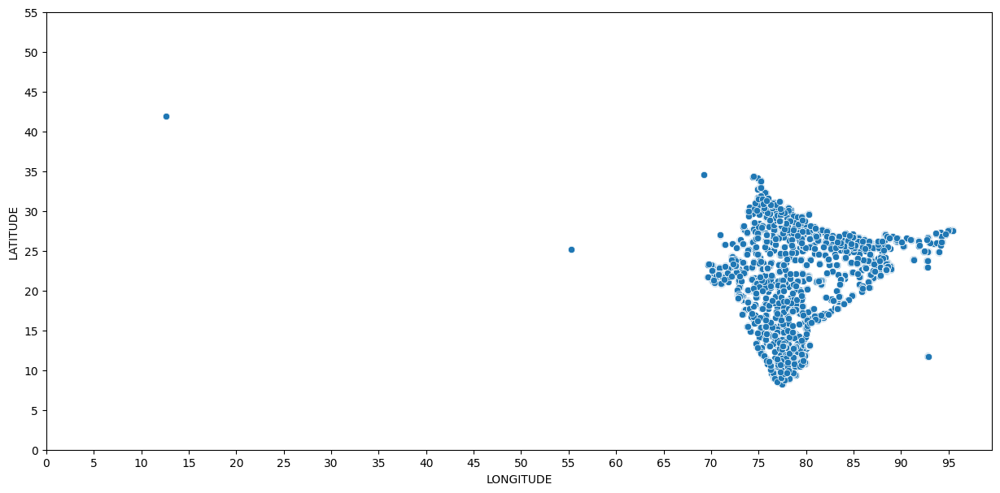

In [11]:
# Plotting Device Locations of the events data
fig, ax = plt.subplots(figsize=(15,7))
sns.scatterplot(y=df_events_data['latitude'], x=df_events_data['longitude'])
plt.ylabel('LATITUDE')
plt.xlabel('LONGITUDE')
plt.xticks(ticks=np.arange(0, 100, 5))
plt.yticks(ticks=np.arange(0, 60, 5))
plt.show()

<a name = Section24></a>
### **2.4 Data Transformation and Cleaning**

### Objectives:

Clean and preprocess the data to handle missing values, outliers, and inconsistencies. This will involve:

- Identifying and handling missing values in the datasets.
- Detecting and addressing outliers or erroneous data points.
- Resolving any inconsistencies or discrepancies in the data.

### Handle missing values

In [12]:
df_events_data.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [13]:
# To address missing values in the 'state' column, we will impute them using the corresponding 'city' details.
# Create a dictionary using the existing 'state' and 'city' values
state_city_dict = df_events_data.dropna(subset=['state']).set_index('city')['state'].to_dict()

# Impute missing values in 'state' using 'city' details
df_events_data['state'] = df_events_data['state'].fillna(df_events_data['city'].map(state_city_dict))

### Detect and address outliers

In [14]:
# Create a separate data frame for anomaly locations
data_anomaly = df_events_data[df_events_data['longitude'] < 69.5]

# Create a map centered on the average latitude and longitude of anomaly locations
center_latitude = data_anomaly['latitude'].mean()
center_longitude = data_anomaly['longitude'].mean()
map_with_anomalies = folium.Map(location=[center_latitude, center_longitude], zoom_start=4)

# Add markers for missing device ID locations
marker_cluster_missing = MarkerCluster(name='Missing Device ID Locations')
null_device_locations = df_events_data[df_events_data['device_id'].isna()][['city', 'latitude', 'longitude']].values.tolist()
for location in null_device_locations:
    city, latitude, longitude = location
    tooltip = f"City: {city}"
    popup = f"Latitude: {latitude}, Longitude: {longitude}"
    marker = folium.Marker(location=[latitude, longitude], popup=popup, tooltip=tooltip, icon=folium.Icon(color='red'))
    marker.add_to(marker_cluster_missing)
marker_cluster_missing.add_to(map_with_anomalies)

# Add markers for anomaly locations
marker_cluster_anomaly = MarkerCluster(name='Anomaly Locations')
for index, row in data_anomaly.iterrows():
    tooltip = f"City: {row['city']}"
    popup = f"Latitude: {row['latitude']}, Longitude: {row['longitude']}"
    marker = folium.Marker(location=[row['latitude'], row['longitude']], popup=popup, tooltip=tooltip, icon=folium.Icon(color='blue'))
    marker.add_to(marker_cluster_anomaly)
marker_cluster_anomaly.add_to(map_with_anomalies)

# Add layer control to toggle marker clusters
folium.LayerControl().add_to(map_with_anomalies)

# Display the map
map_with_anomalies

In [15]:
# Create a separate DataFrame for VPN users (rows with null device_id)
df_vpn_user = df_events_data[df_events_data['device_id'].isnull()]

# Drop the rows with null device_id from df_events_data
df_events_data = df_events_data.dropna(subset=['device_id'])

In [16]:
# To address anomalies, we will add a column 'current city'
df_events_data['current city'] = df_events_data['city']  # Set 'city' as default 'current city'

# Update 'current city' based on anomalies
df_events_data.loc[df_events_data['longitude'] < 20, 'current city'] = 'Rome'
df_events_data.loc[(df_events_data['longitude'] < 60) & (df_events_data['longitude'] >= 50), 'current city'] = 'Dubai'
df_events_data.loc[(df_events_data['longitude'] < 69.5) & (df_events_data['longitude'] >= 60), 'current city'] = 'Kandahar'

In [17]:
# To address missing latitude & longitude, We calculate the mean latitude and longitude for each 'current city'
# Then we fill in the missing values with the corresponding averages. 
# This approach can help ensure complete data and maintain consistency within each city.

# Calculate the mean latitude and longitude for each 'current city'
city_mean_coordinates = df_events_data.groupby('current city')['latitude', 'longitude'].mean()

# Iterate over the rows with missing latitude and longitude
for index, row in df_events_data[df_events_data['latitude'].isnull() | df_events_data['longitude'].isnull()].iterrows():
    current_city = row['current city']
    
    # Impute missing latitude
    if pd.isnull(row['latitude']):
        df_events_data.at[index, 'latitude'] = city_mean_coordinates.loc[current_city, 'latitude']
    
    # Impute missing longitude
    if pd.isnull(row['longitude']):
        df_events_data.at[index, 'longitude'] = city_mean_coordinates.loc[current_city, 'longitude']

In [18]:
df_events_data.isnull().sum()

event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
current city    0
dtype: int64

### Using df_gender_age_train dataset to get the Age, Gender & Group of our users

In [19]:
df_gender_age_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   device_id  74645 non-null  float64
 1   gender     74645 non-null  object 
 2   age        74645 non-null  int64  
 3   group      74645 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 2.3+ MB


In [20]:
# Generate the crosstab to check if some Males or Females have been grouped wrongly
gender_crosstab = pd.crosstab(df_gender_age_train['gender'], df_gender_age_train['group'])
print("Cross-tabulation for Gender and Group:")
gender_crosstab

Cross-tabulation for Gender and Group:


group,F23-,F24-26,F27-28,F29-32,F33-42,F43+,M22-,M23-26,M27-28,M29-31,M32-38,M39+
gender,,,,,,,,,,,,
F,5050,4190,3118,4628,5561,4194,0,0,0,0,0,0
M,0,0,0,0,0,0,7488,9605,5445,7309,9476,8581


In [21]:
# Generate the crosstab to check if some Ages have been grouped wrongly
age_crosstab = pd.crosstab(df_gender_age_train['age'], df_gender_age_train['group'])
print("\nCross-tabulation for Age and Group:")
age_crosstab

age_crosstab = pd.crosstab(df_gender_age_train['age'], df_gender_age_train['group'])
print("\nCross-tabulation for Age and Group:")
age_crosstab


Cross-tabulation for Age and Group:

Cross-tabulation for Age and Group:


group,F23-,F24-26,F27-28,F29-32,F33-42,F43+,M22-,M23-26,M27-28,M29-31,M32-38,M39+
age,,,,,,,,,,,,
1,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,4,0,0,0,0,0
10,2,0,0,0,0,0,3,0,0,0,0,0
11,4,0,0,0,0,0,0,0,0,0,0,0
12,5,0,0,0,0,0,9,0,0,0,0,0
13,5,0,0,0,0,0,10,0,0,0,0,0
14,14,0,0,0,0,0,21,0,0,0,0,0
15,10,0,0,0,0,0,55,0,0,0,0,0
16,40,0,0,0,0,0,122,0,0,0,0,0


In [22]:
# Correcting redundant & inconsistant ages for males based on groupings provided
df_gender_age_train.loc[df_gender_age_train['gender'] == 'M', 'age'] = df_gender_age_train['age'].apply(lambda x: 22 if x < 22 else (39 if x > 39 else x))

# Correcting redundant & inconsistant ages for females based on groupings provided
df_gender_age_train.loc[df_gender_age_train['gender'] == 'F', 'age'] = df_gender_age_train['age'].apply(lambda x: 23 if x < 23 else (43 if x > 43 else x))

In [23]:
# Joining df_events_data with Demographics of User DataFrame
df_events_data = df_events_data.merge(df_gender_age_train, on='device_id', how='left')

In [24]:
df_events_data.isnull().sum()

event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
city            0
state           0
current city    0
gender          0
age             0
group           0
dtype: int64

### Using 'df_phone_brand_device_model' dataset to get the Phone Brand & Device Model of our users

In [25]:
# Cleaning & Correcting 'phone_brand_device_model Before merging with df_events_data
df_phone_brand_device_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   device_id     87726 non-null  float64
 1   phone_brand   87726 non-null  object 
 2   device_model  87726 non-null  object 
dtypes: float64(1), object(2)
memory usage: 2.0+ MB


In [26]:
# Correcting Chinesh Brand names to English manually - done through Google Translate. 
# For more Brands, appropriate libraries can be used

df_phone_brand_device_model['phone_brand'] = df_phone_brand_device_model['phone_brand'].replace(to_replace = ['vivo', '小米', 'OPPO',
        '三星', '酷派', '联想 ', '华为', '奇酷', '魅族', '斐讯',
       '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米', 'ZUK', '努比亚', '惠普',
       '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视', '乐视', '海信', '百立丰',
       '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯', '聆韵', 'TCL', '酷珀', '爱派尔',
       'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼', '康佳', '优购', '邦华', '赛博宇华',
       '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚', '普耐尔', '糖葫芦', '亿通', '欧新',
       '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米', '米歌', 'E人E本', '西米', '大Q',
       '台电', '飞利浦', '唯米', '大显', '长虹', '维图', '青橙', '本为', '虾米', '夏新', '帷幄',
       '百加', 'SUGAR', '欧奇', '世纪星', '智镁', '欧比', '基伍', '飞秒', '德赛', '易派',
       '谷歌', '金星数码', '广信', '诺亚信', 'MIL', '白米', '大可乐', '宝捷讯', '优语', '首云',
       '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米', '凯利通', '唯比', '欧沃', '丰米', '恒宇丰',
       '奥克斯', '西门子', '欧乐迪', 'PPTV'],
        value= ['vivo', 'Xiaomi', 'OPPO', 'Samsung', 'Coolpad', 'Lenovo', 'Huawei', 'Qiku', 'Meizu', 'Phixun',
       'China Mobile', 'HTC', 'Tianyu', 'Supreme treasure', 'LG', 'Oboxin', 'Youmi', 'ZUK', 'Nubia', 'HP',
       'Nibiru', 'Meitu', 'Xiangmi', 'Motorola', 'Mengmi', 'Hammer', 'InFocus', 'LeTV', 'Hisense', 'Bailifeng',
       'OnePlus', 'Yuxin', 'Haier', 'Cooby', 'Newman', 'Waveguide', 'Duowei', 'Ling Yun', 'TCL', 'Cooper', 'Aipel' ,
       'LOGO', 'Scallion', 'Guomi', 'Asus', 'Onda', 'Aiuni', 'Konka', 'Yougo', 'Banghua', 'Cyber Yuhua',
       'Black Rice', 'Lovme', 'Pioneer', 'E Pie', 'Shenzhou', 'Nokia', 'Pure', 'Candied Hulu', 'Yitong', 'Ouxin',
       'Mickey', 'Cool Doo Cube', 'Blue Devil', 'Little Poplar', 'Belfeng', 'Glutinous Rice', 'Mi Song', 'Eren Eben', 'Simi', 'Big Q' ,
       'Taipower', 'Philips', 'Weimi', 'Daxian', 'Changhong', 'Vitu', 'Qingcheng', 'Original', 'Shrimp', 'Xiaxin', 'Huang',
       'Baika', 'SUGAR', 'Okey', 'Century Star', 'Chi-Mag', 'Obi', 'Kivu', 'Femtosecond', 'Desai', 'Epai',
       'Google', 'Venus Digital', 'Guangxin', 'Noahs letter', 'MIL', 'White Rice', 'Big Cola', 'Baojixun', 'Youyu', 'Shouyun',
       'Rimi', 'Rigao', 'Wopfeng', 'Mole', 'Xianmi', 'Kellytong', 'Vip', 'Owo', 'Fengmi', 'Hengyufeng',
       'Ox', 'Siemens', 'Oraldi', 'PPTV'])

In [27]:
# Correcting 'phone_brand_device_model' inconsistencies
df_phone_brand_device_model['device_model'] = df_phone_brand_device_model['device_model'].str.strip()

In [28]:
# Correcting Chinesh device model names to English manually - done through Google Translate. 
# For more device models, appropriate libraries can be used

df_phone_brand_device_model['device_model'] = df_phone_brand_device_model['device_model'].replace(to_replace = ['红米Note2','红米Note3','大神F1Plus','note顶配版','星星1号','红米note', '青春版','荣耀4A','魅蓝Note 2',
                        '荣耀7i','荣耀畅玩4C','红米2A','荣耀畅玩5','荣耀7',  '红米1S','麦芒4','荣耀6','荣耀畅玩4X','荣耀3X畅玩版','荣耀X2',
                        '魅蓝NOTE','荣耀6 Plus','荣耀+','荣耀畅玩4','黄金斗士A8','小米note','荣耀3C','小米4C','红米note增强版','天鉴W900', '荣耀畅玩5X',
                        '红米2','大神F1','魅蓝2','Mate 7 青春版','乐檬K3 Note','火星一号','乐檬K3', '联想黄金斗士S8','大神F2','魅蓝','荣耀6 plus','大神F2全高清版',
                        '灵感XL','旗舰版','坚果手机','红米', '超级手机1 Pro','畅享5','魅蓝metal','超级手机1','超级手机1s','荣耀U8860','纽扣','荣耀畅玩平板T1', '红辣椒 X1',
                        '春雷HD','ivvi 小i','荣耀畅玩4C运动版','麦芒3','小鲜2','大器2', '锋尚','大神X7','小苹果','乐玩','大神Note3','么么哒3N','锋尚Pro','红辣椒','荣耀3X',
                        '三星big foot','荣耀3C畅玩版','ivvi 小骨Pro', '红辣椒XM', '远航3', 'My 布拉格', 'metal 标准版', '畅享5S', '红辣椒Note', '锋尚Max', '2016版 Galaxy', '红牛V5',
                        '2016版 Galaxy', '锋尚2','金钢','野火S','2016版 Galaxy','红米3','小辣椒 X3','荣耀平板T1-','大神Note','7295A青春版','大Q Note','么么哒',
                        '小辣椒 M2','黄金斗士Note8','炫影S+','风华3','TALK 7X四核','2016版 Galaxy', '天鉴T1','土星一号', '麦芒3S','飞马','联想VIBE X2', '威武3', '红辣椒任性版',
                        '小辣椒 9', '大观4', '超级手机Max','星星2号','雷霆战机','威武3C', '倾城L3','Z9 mini 精英版','小辣椒S1', '小辣椒 5','T03锋至版','乐玩2C','么么哒3S','乐K31',
 '黄金斗士S8畅玩版','时尚手机'],
                            value= ['Redmi Note2', 'Redmi Note3', 'Great God F1Plus', 'note top version', 'Star 1', 'Redmi note',  'Youth Edition','Honor 4A','Meizu Note 2','Honor 7i','Honor Play 4C','Redmi 2A','Honor Play 5','Honor 7', 'Redmi 1S', 'Maimang 4', 'Honor 6', 'Honor Play 4X', 'Honor 3X Play Edition', 'Honor X2', 'Mei Lan NOTE', 'Honor 6 Plus',
                        'Honor+', 'Honor Play 4', 'Golden Fighter A8', 'Xiaomi Note', 'Honor 3C', 'Xiaomi 4C', 'Redmi Note Enhanced Edition', 'Tianjian W900',
                        'Honor Play 5X','Red Rice 2','Great God F1','Meizu 2','Mate 7 Youth Edition','Lemeng K3 Note','Mars One','Lemeng K3',
                        'Lenovo Gold Fighter S8', 'Dashen F2', 'Charm Blue', 'Honor 6 plus', 'Dashen F2 Full HD Version', 'Inspiration XL', 'Ultimate Edition', 'Nut Phone', 'Red Rice' ,
                        'Super Phone 1 Pro', 'Enjoy 5', 'Meizu Metal', 'Super Phone 1', 'Super Phone 1s', 'Honor U8860', 'Button', 'Honor Play Tablet T1', 'Red Pepper X1', 'Chunlei HD', 'ivvi Xiaoi', 'Honor Play 4C Sports Edition', 'Maimang 3', 'Xiaoxian 2','Big 2','Feng Shang','Great God X7','Little Apple','Have fun','Great God Note3','Momoda 3N','Fengshang Pro','Red chilli','Honor 3X','Samsung big foot','Honor 3C Play Edition','ivvi Osicles Pro', 'Red Pepper XM','voyage 3','My Prague','metal Standard Edition','Enjoy 5S','Red Pepper Note','Feng Shang Max','2016 Edition Galaxy','Red Bull V5','2016 Edition Galaxy','Feng Shang 2','Golden Steel','Wildfire S','2016 Edition Galaxy','Red Rice 3','Pepper X3','Honor Tablet T1-','Great God Note','7295A Youth Edition','Big Q Note','mwah','Pepper M2','Golden Warrior Note8', 'Hyunying S+','Fenghua 3','TALK 7X Quad Core','2016 version of Galaxy','Tianjian T1','Saturn One','Maimang 3S','Pegasus','Lenovo VIBE X2','Mighty 3','Red pepper capricious version','Pepper 9','Grand View 4','Super Phone Max','Star 2','Thunder Fighter','Mighty 3C','Allure L3','Z9 mini Elite Edition','Chili S1','Pepper 5','T03 Frontier Edition','Fun 2C','Momada 3S','Lemeng K31','Golden Fighter S8 Play Edition','Fashionable phone'])


In [29]:
# Replace device_model values with their corresponding replacements

df_phone_brand_device_model['device_model'] = df_phone_brand_device_model['device_model'].replace(
    to_replace=['2016版GalaxyA9', '2016版GalaxyA5', '2016版GalaxyA7', '荣耀平板T1823L', '2016版GalaxyJ7',
                '红辣椒任性版Plus', '乐檬K31', '大神1s', '倾城L3C', '小辣椒4', 'XperiaZ1炫彩版', '微客', '黄金斗士青春版',
                '红辣椒NXPlus', '小鲜3', '小星星', '大器3', '小辣椒6', '金刚II', '中兴远航3', 'Axon天机', '青漾3',
                '小辣椒3', '旋影90w', '小辣椒7', '醉享', '渴望HD', '小辣椒M3', '飞马3', '领世旗舰3', '小辣椒X4',
                '红辣椒Note3', '天鉴W808', '天鉴W900S', '大观铂顿', '魅蓝Note3', 'RazrV锋芒', '火星一号探索版',
                'MotoX极', '魔镜X5', '小章鱼', '乐檬3', '乐檬X3', '飞马2Plus', '2016版 Galaxy A9', '2016版 Galaxy A7', '2016版 Galaxy A5', '荣耀平板T1-823L'],
    value=['GalaxyA9 2016', 'GalaxyA5 2016', 'GalaxyA7 2016', 'Honor Tablet T1823L', 'GalaxyJ7 2016',
           'Red Pepper Plus', 'Lemeng K31', 'Great God 1s', 'Qingcheng L3C', 'Little Pepper 4',
           'Xperia Z1 Colorful Edition', 'Weike', 'Golden Fighter Youth Edition', 'Red Pepper NXPlus',
           'Little Fresh 3', 'Little Star', 'Big Machine 3', 'Little Pepper 6', 'King Kong II',
           'ZTE Yuanhang 3', 'Axon', 'Qingyang 3', 'Little Pepper 3', 'Swirl Shadow 90w',
           'Little Pepper 7', 'Drunk Enjoy', 'Desire HD', 'Little Pepper M3', 'Pegasus 3',
           'Leading Flagship 3', 'Little Pepper X4', 'Red Pepper Note3', 'Tianjian W808',
           'Tianjian W900S', 'Grand View Platinum', 'Meizu Note3', 'RazrV Edge',
           'Mars One Exploration Edition', 'MotoX Extreme', 'Magic Mirror X5', 'Little Octopus',
           'Le Meng 3', 'Lemon X3', 'Pegasus 2Plus', '2016 Galaxy A7', '2016 Galaxy A9', '2016 Galaxy A5', 'Honor Tablet T1-823L']
)

In [30]:
# Define a regular expression pattern to match non-English characters
non_english_pattern = re.compile(r'[^\x00-\x7F]+')

# Filter the device models that contain non-English characters
non_english_device_models = df_phone_brand_device_model[df_phone_brand_device_model['device_model'].str.contains(non_english_pattern, regex=True)]

# Display the device models with non-English characters
non_english_device_models['device_model']

5314     2016版 Galaxy J7
7270         红辣椒任性版 Plus
14890        红辣椒任性版 Plus
17870              小辣椒 4
18175      Xperia Z1 炫彩版
19275         红辣椒NX Plus
20549        红辣椒任性版 Plus
25873              小辣椒 6
27198        红辣椒任性版 Plus
28900      Xperia Z1 炫彩版
29432              小辣椒 4
31787              小辣椒 3
32554      Xperia Z1 炫彩版
33344              小辣椒 7
36288             小辣椒 M3
38291              小辣椒 6
40049      Xperia Z1 炫彩版
43661             小辣椒 M3
46493         红辣椒NX Plus
47210              小辣椒 4
50296      Xperia Z1 炫彩版
50802        红辣椒任性版 Plus
51910      Xperia Z1 炫彩版
52341              小辣椒 3
54341      Xperia Z1 炫彩版
55348             小辣椒 M3
55754        红辣椒任性版 Plus
59698             小辣椒 M3
61934        红辣椒任性版 Plus
63950           Razr V锋芒
64278              小辣椒 4
69278              小辣椒 4
69948              小辣椒 7
70382              小辣椒 3
71390            Moto X极
73991              小辣椒 6
74843             小辣椒 M3
75435      Xperia Z1 炫彩版
75787              魔镜 X5
78973           Razr V锋芒


In [31]:
# Merging phone_brand_device_model based on 'device_id'
df_events_data = df_events_data.merge(df_phone_brand_device_model[['device_id', 'phone_brand', 'device_model']], on='device_id', how='left')

In [32]:
# Sorting the DataFrame by device_id and timestamp
df_events_data.sort_values(['device_id', 'timestamp'], inplace=True)

In [33]:
# Getting the details about when the data was collected

start_date = df_events_data['timestamp'].min().strftime('%dth %B %Y')
start_time = df_events_data['timestamp'].min().strftime('%I:%M %p')
end_date = df_events_data['timestamp'].max().strftime('%dth %B %Y')
end_time = df_events_data['timestamp'].max().strftime('%I:%M %p')

print(f"Data collected from: {start_date} at {start_time}")
print(f"Data collected up to: {end_date} at {end_time}")
print(f"Time Span: from {start_date} {start_time} to {end_date} {end_time}")

Data collected from: 30th April 2016 at 11:52 PM
Data collected up to: 08th May 2016 at 12:00 AM
Time Span: from 30th April 2016 11:52 PM to 08th May 2016 12:00 AM


In [34]:
# Extracting date, day of the week & hour of the day from the timestamp
df_events_data['date'] = df_events_data['timestamp'].dt.date
df_events_data['day_of_week'] = df_events_data['timestamp'].dt.strftime('%A')
df_events_data['hour_of_day'] = df_events_data['timestamp'].dt.hour

# Extracting period of the day (morning, afternoon, evening, night)
bins = [0, 6, 12, 18, 24]
labels = ['Night', 'Morning', 'Afternoon', 'Evening']
df_events_data['period_of_day'] = pd.cut(df_events_data['hour_of_day'], bins=bins, labels=labels)

In [35]:
df_events_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3252497 entries, 2224965 to 1165243
Data columns (total 17 columns):
 #   Column         Dtype         
---  ------         -----         
 0   event_id       int64         
 1   device_id      float64       
 2   timestamp      datetime64[ns]
 3   longitude      float64       
 4   latitude       float64       
 5   city           object        
 6   state          object        
 7   current city   object        
 8   gender         object        
 9   age            int64         
 10  group          object        
 11  phone_brand    object        
 12  device_model   object        
 13  date           object        
 14  day_of_week    object        
 15  hour_of_day    int64         
 16  period_of_day  category      
dtypes: category(1), datetime64[ns](1), float64(3), int64(3), object(9)
memory usage: 424.9+ MB


### Creating new features based on existing data to enhance analysis & aggregating data to enable temporal analysis.

In [36]:
# Copying Events data to a new dataframe where user behaviour features can be generated
df_population = df_events_data.copy()

# Calculate the time difference in minutes between phone calls for each device_id (user)
df_population['call_interval'] = df_population.groupby('device_id')['timestamp'].diff().dt.total_seconds() / 60

In [37]:
# Filter out non-finite values in 'call_interval'
df_population.dropna(subset=['call_interval'], inplace=True)

# Calculate the mean interval in minutes between calls for each device_id (user) using transform
df_population['mean_call_interval'] = df_population.groupby('device_id')['call_interval'].transform('mean').astype(int)

# Calculate user activity statistics using transform
df_population['call_count'] = df_population.groupby('device_id')['call_interval'].transform('count')

# Grouping user activity by device_id and aggregating statistics
user_activity = df_population.groupby('device_id').agg({
    'day_of_week': lambda x: x.mode().iat[0] if not x.dropna().empty else np.nan,
    'hour_of_day': lambda x: x.mode().iat[0] if not x.dropna().empty else np.nan,
    'period_of_day': lambda x: x.mode().iat[0] if not x.dropna().empty else np.nan,
}).reset_index()
user_activity.columns = ['device_id', 'mode_day_of_week', 'mode_hour_of_day', 'mode_period_of_day']

In [38]:
# Dropping duplicates from df_events_data to get unique device ids
df_population.drop_duplicates(subset='device_id', keep='first', inplace=True)

# Dropping event-related columns from df_population
df_population.drop(['event_id', 'timestamp', 'date', 'day_of_week', 'hour_of_day', 'period_of_day', 'call_interval'], axis=1, inplace=True)

# Dropping other states from Sample to retain only Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu & Kashmir, Goa & Nagaland customers
states_to_focus = ['MadhyaPradesh', 'Chhattisgarh', 'Uttaranchal', 'JammuandKashmir', 'Goa', 'Nagaland']
df_sample = df_population[df_population['state'].isin(states_to_focus)].copy()

# Merging user_activity with df_population and df_sample
df_population = pd.merge(df_population, user_activity, on='device_id', how='left')
df_sample = pd.merge(df_sample, user_activity, on='device_id', how='left')

In [39]:
# Print the shape of the Events Data dataframe
print('Number of users in Events Data:', df_events_data.shape)

# Print the shape of the VPN User dataframe
print('Number of users in VPN User:', df_vpn_user.shape)

# Print the shape of the Population dataframe
print('Number of users in Population:', df_population.shape)

# Print the shape of the Sample dataframe
print('Number of users in Sample:', df_sample.shape)

Number of users in Events Data: (3252497, 17)
Number of users in VPN User: (453, 7)
Number of users in Population: (54548, 16)
Number of users in Sample: (3978, 16)


In [40]:
df_population.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54548 entries, 0 to 54547
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   device_id           54548 non-null  float64
 1   longitude           54548 non-null  float64
 2   latitude            54548 non-null  float64
 3   city                54548 non-null  object 
 4   state               54548 non-null  object 
 5   current city        54548 non-null  object 
 6   gender              54548 non-null  object 
 7   age                 54548 non-null  int64  
 8   group               54548 non-null  object 
 9   phone_brand         54548 non-null  object 
 10  device_model        54548 non-null  object 
 11  mean_call_interval  54548 non-null  int64  
 12  call_count          54548 non-null  int64  
 13  mode_day_of_week    54548 non-null  object 
 14  mode_hour_of_day    54548 non-null  int64  
 15  mode_period_of_day  54315 non-null  object 
dtypes: f

### Verifying the integrity of the merged dataset by checking for consistency across the common columns.

In [41]:
# Extracting Categorical & Numerical columns to perform further analysis & cleaning
categorical_cols = df_sample.select_dtypes('object').columns
numerical_cols = df_sample.select_dtypes(['int64', 'float64']).columns

# Checking Unique Values and Null Counts in Dataset by taking a sample and displaying a few unique values
print('\n' + 'Having a look at unique values and null counts in each column')
print('\n' + '-'*50 + '\n')

for col in df_sample.columns:
    unique_vals = df_sample[col].unique()
    num_unique = len(unique_vals)
    null_count = df_sample[col].isnull().sum()

    print(f"Column Name: {col}\n")
    if col in categorical_cols:
        print(f"Data Type: Categorical | Unique Values: {num_unique} | Null Count: {null_count}\n")
        print(unique_vals[:30])  # Display only 30 unique values for categorical columns
    else:
        print(f"Data Type: Numerical | Unique Values: {num_unique} | Null Count: {null_count}\n")
        print(df_sample[col].sample(300).unique()[:10])

    print('\n' + '-'*70 + '\n')


Having a look at unique values and null counts in each column

--------------------------------------------------

Column Name: device_id

Data Type: Numerical | Unique Values: 3978 | Null Count: 0

[9.03e+17 8.12e+18 5.18e+18 6.29e+18 6.73e+18 4.87e+15 5.31e+16 8.97e+18
 8.84e+18 3.95e+18]

----------------------------------------------------------------------

Column Name: longitude

Data Type: Numerical | Unique Values: 3967 | Null Count: 0

[75.91 79.55 75.94 75.93 75.92 75.88 75.9  76.15 75.24 78.35]

----------------------------------------------------------------------

Column Name: latitude

Data Type: Numerical | Unique Values: 3970 | Null Count: 0

[22.75 22.73 23.89 23.17 26.25 25.46 22.78 22.15 22.76 22.78]

----------------------------------------------------------------------

Column Name: city

Data Type: Categorical | Unique Values: 85 | Null Count: 0

['Kathua' 'Itarsi' 'Shivapuri' 'Vidisha' 'Kohima' 'Indore' 'Hoshangabad'
 'Bhilai' 'Panaji' 'Dimapur' 'Bhind' 'Mormuga

---
<a name = Section3></a>
# **3. Demographic Analysis**
---

<a name = Section31></a>
### **3.1 Distribution of Accredian Telecom Users by Gender**

In [42]:
# Calculate the value counts of males and females in the population and sample datasets
male_count_all = len(df_population[df_population['gender'] == 'M'])
female_count_all = len(df_population[df_population['gender'] == 'F'])
male_count_sample = len(df_sample[df_sample['gender'] == 'M'])
female_count_sample = len(df_sample[df_sample['gender'] == 'F'])

# Print the observations
print("Observations:")
print(f"- In the population dataset, there are {male_count_all} males and {female_count_all} females.")
print(f"- In the sample dataset, there are {male_count_sample} males and {female_count_sample} females.")

Observations:
- In the population dataset, there are 35146 males and 19402 females.
- In the sample dataset, there are 2493 males and 1485 females.


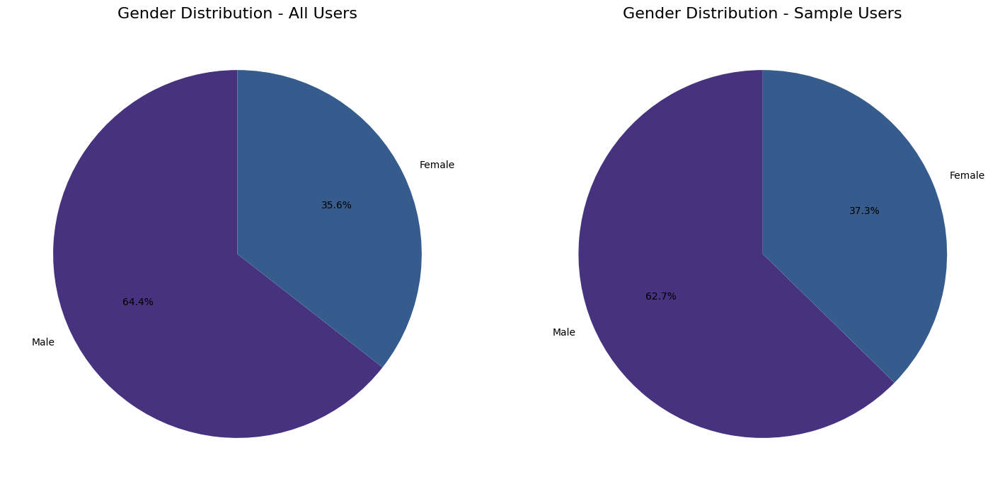

In [43]:
# Set the color palette
sns.set_palette("viridis")

# Calculate the proportions of males and females in the population and sample datasets
male_proportion_all = len(df_population[df_population['gender'] == 'M']) / len(df_population)
female_proportion_all = len(df_population[df_population['gender'] == 'F']) / len(df_population)
male_proportion_sample = len(df_sample[df_sample['gender'] == 'M']) / len(df_sample)
female_proportion_sample = len(df_sample[df_sample['gender'] == 'F']) / len(df_sample)

# Create the first canvas with two pie charts
fig1, axes1 = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

# Pie Chart - Gender Distribution (Nation-wide users)
ax1 = axes1[0]
gender_labels_all = ['Male', 'Female']
gender_values_all = [male_proportion_all, female_proportion_all]
ax1.pie(gender_values_all, labels=gender_labels_all, autopct='%1.1f%%', startangle=90)
ax1.set_title('Gender Distribution - All Users', fontsize=16)

# Pie Chart - Gender Distribution (Sample users)
ax2 = axes1[1]
gender_labels_sample = ['Male', 'Female']
gender_values_sample = [male_proportion_sample, female_proportion_sample]
ax2.pie(gender_values_sample, labels=gender_labels_sample, autopct='%1.1f%%', startangle=90)
ax2.set_title('Gender Distribution - Sample Users', fontsize=16)

# Adjust the spacing between subplots in the first canvas
plt.tight_layout()

# Show the first canvas
plt.show()

<a name = Section32></a>
### **3.2 Distribution of Accredian Telecom Users by Age Segments**

In [44]:
# Calculate the value counts for male users
male_age_counts = df_population[df_population['gender'] == 'M']['group'].value_counts().sort_index()

# Calculate the value counts for female users
female_age_counts = df_population[df_population['gender'] == 'F']['group'].value_counts().sort_index()

# Print the observations
print("Observations - Male Users:")
for age_segment, count in male_age_counts.items():
    print(f"- Age segment {age_segment}: {count} users")

print("Observations - Female Users:")
for age_segment, count in female_age_counts.items():
    print(f"- Age segment {age_segment}: {count} users")

Observations - Male Users:
- Age segment M22-: 5285 users
- Age segment M23-26: 6947 users
- Age segment M27-28: 3996 users
- Age segment M29-31: 5379 users
- Age segment M32-38: 7083 users
- Age segment M39+: 6456 users
Observations - Female Users:
- Age segment F23-: 3606 users
- Age segment F24-26: 3009 users
- Age segment F27-28: 2233 users
- Age segment F29-32: 3410 users
- Age segment F33-42: 4050 users
- Age segment F43+: 3094 users


In [45]:
# Define the group orders
male_group_order = ['M22-', 'M23-26', 'M27-28', 'M29-31', 'M32-38', 'M39+']
female_group_order = ['F23-', 'F24-26', 'F27-28', 'F29-32', 'F33-42', 'F43+']

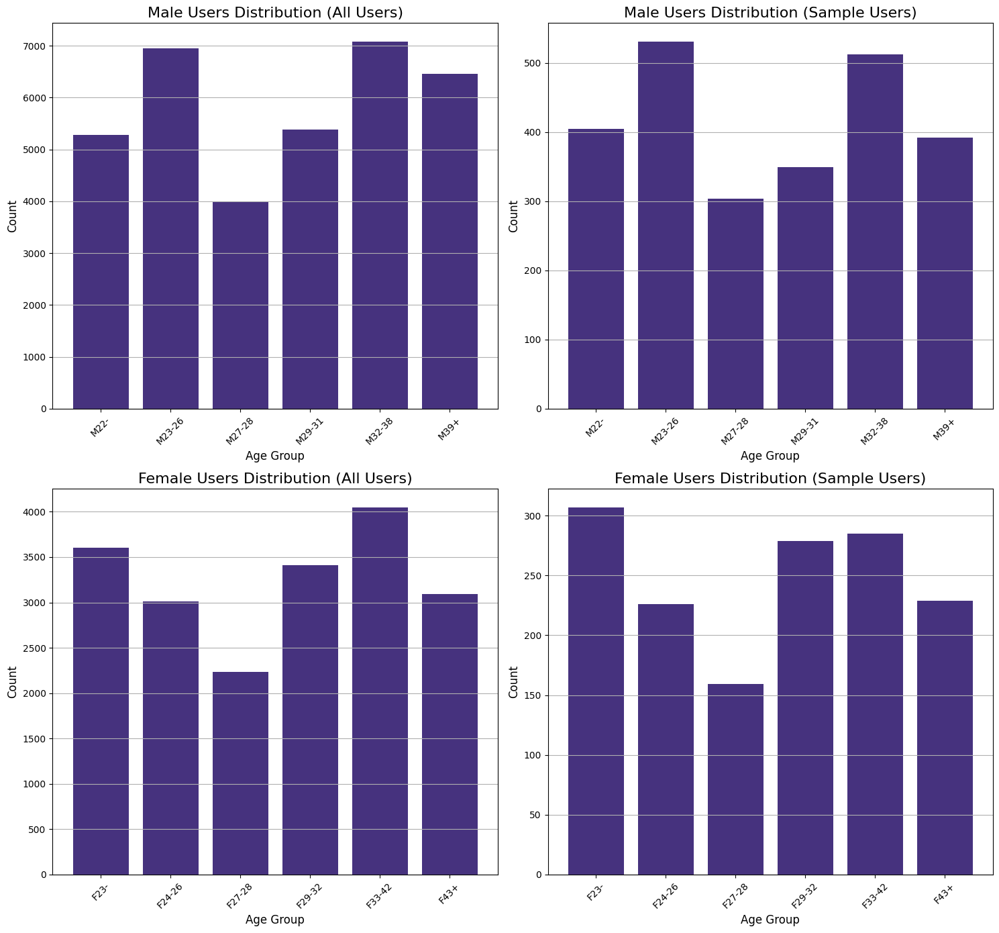

In [46]:
# Create the second canvas with four bar charts
fig2, axes2 = plt.subplots(nrows=2, ncols=2, figsize=(15, 14))

# Gender Distribution - Male Users (Nation-wide users)
ax3 = axes2[0, 0]
male_data_all = df_population[df_population['gender'] == 'M']
male_group_counts_all = male_data_all['group'].value_counts().reindex(male_group_order)
ax3.bar(male_group_counts_all.index, male_group_counts_all.values)
ax3.set_title('Male Users Distribution (All Users)', fontsize=16)
ax3.set_xlabel('Age Group', fontsize=12)
ax3.set_ylabel('Count', fontsize=12)
ax3.tick_params(axis='x', labelrotation=45)
ax3.grid(axis='y')

# Gender Distribution - Male Users (from Madhya Pradesh,Chhattisgarh,Uttaranchal,Jammu & Kashmir,Goa & Nagaland)
ax4 = axes2[0, 1]
male_data_sample = df_sample[df_sample['gender'] == 'M']
male_group_counts_sample = male_data_sample['group'].value_counts().reindex(male_group_order)
ax4.bar(male_group_counts_sample.index, male_group_counts_sample.values)
ax4.set_title('Male Users Distribution (Sample Users)', fontsize=16)
ax4.set_xlabel('Age Group', fontsize=12)
ax4.set_ylabel('Count', fontsize=12)
ax4.tick_params(axis='x', labelrotation=45)
ax4.grid(axis='y')

# Gender Distribution - Female Users (Nation-wide users)
ax5 = axes2[1, 0]
female_data_all = df_population[df_population['gender'] == 'F']
female_group_counts_all = female_data_all['group'].value_counts().reindex(female_group_order)
ax5.bar(female_group_counts_all.index, female_group_counts_all.values)
ax5.set_title('Female Users Distribution (All Users)', fontsize=16)
ax5.set_xlabel('Age Group', fontsize=12)
ax5.set_ylabel('Count', fontsize=12)
ax5.tick_params(axis='x', labelrotation=45)
ax5.grid(axis='y')

# Gender Distribution - Female Users (from Madhya Pradesh,Chhattisgarh,Uttaranchal,Jammu & Kashmir,Goa & Nagaland)
ax6 = axes2[1, 1]
female_data_sample = df_sample[df_sample['gender'] == 'F']
female_group_counts_sample = female_data_sample['group'].value_counts().reindex(female_group_order)
ax6.bar(female_group_counts_sample.index, female_group_counts_sample.values)
ax6.set_title('Female Users Distribution (Sample Users)', fontsize=16)
ax6.set_xlabel('Age Group', fontsize=12)
ax6.set_ylabel('Count', fontsize=12)
ax6.tick_params(axis='x', labelrotation=45)
ax6.grid(axis='y')

# Adjust the spacing between subplots in the second canvas
plt.tight_layout()

# Show the second canvas
plt.show()

---
<a name = Section4></a>
# **4. Geographical Analysis**
---

<a name = Section41></a>
### **4.1 Distribution of Accredian Telecom across in Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu & Kashmir, Goa & Nagaland**

In [47]:
# Create a map centered on the average latitude and longitude of the sample users
center_latitude = df_sample['latitude'].mean()
center_longitude = df_sample['longitude'].mean()
map_demographics = folium.Map(location=[center_latitude, center_longitude], zoom_start=6)

# Create marker clusters for each state: Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu & Kashmir, Goa, Nagaland
states = ['MadhyaPradesh', 'Chhattisgarh', 'Uttaranchal', 'JammuandKashmir', 'Goa', 'Nagaland']
for state in states:
    state_data = df_sample[df_sample['state'] == state]
    marker_cluster = MarkerCluster(name=state + " Users")
    for index, row in state_data.iterrows():
        tooltip = f"City: {row['city']}"
        popup = f"State: {row['state']}<br>City: {row['city']}<br>Phone Brand: {row['phone_brand']}<br>Device Model: {row['device_model']}"
        marker = folium.Marker(location=[row['latitude'], row['longitude']], popup=popup, tooltip=tooltip)
        marker.add_to(marker_cluster)
    marker_cluster.add_to(map_demographics)

# Add layer control to toggle marker clusters
folium.LayerControl().add_to(map_demographics)

# Display the map
map_demographics

In [48]:
# Observations - Distribution of Accredian Telecom across in Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu & Kashmir, Goa & Nagaland

print("Observations - Distribution of Accredian Telecom across states:")
for state in states:
    state_data = df_sample[df_sample['state'] == state]
    count = len(state_data)
    print(f"- State: {state}, Users: {count}")

Observations - Distribution of Accredian Telecom across states:
- State: MadhyaPradesh, Users: 3038
- State: Chhattisgarh, Users: 350
- State: Uttaranchal, Users: 232
- State: JammuandKashmir, Users: 200
- State: Goa, Users: 68
- State: Nagaland, Users: 90


---
<a name = Section5></a>
# **5. Phone Brand Analysis**
---

<a name = Section51></a>
### **5.1 Distribution of Accredian Telecom Users by Phone Brands**

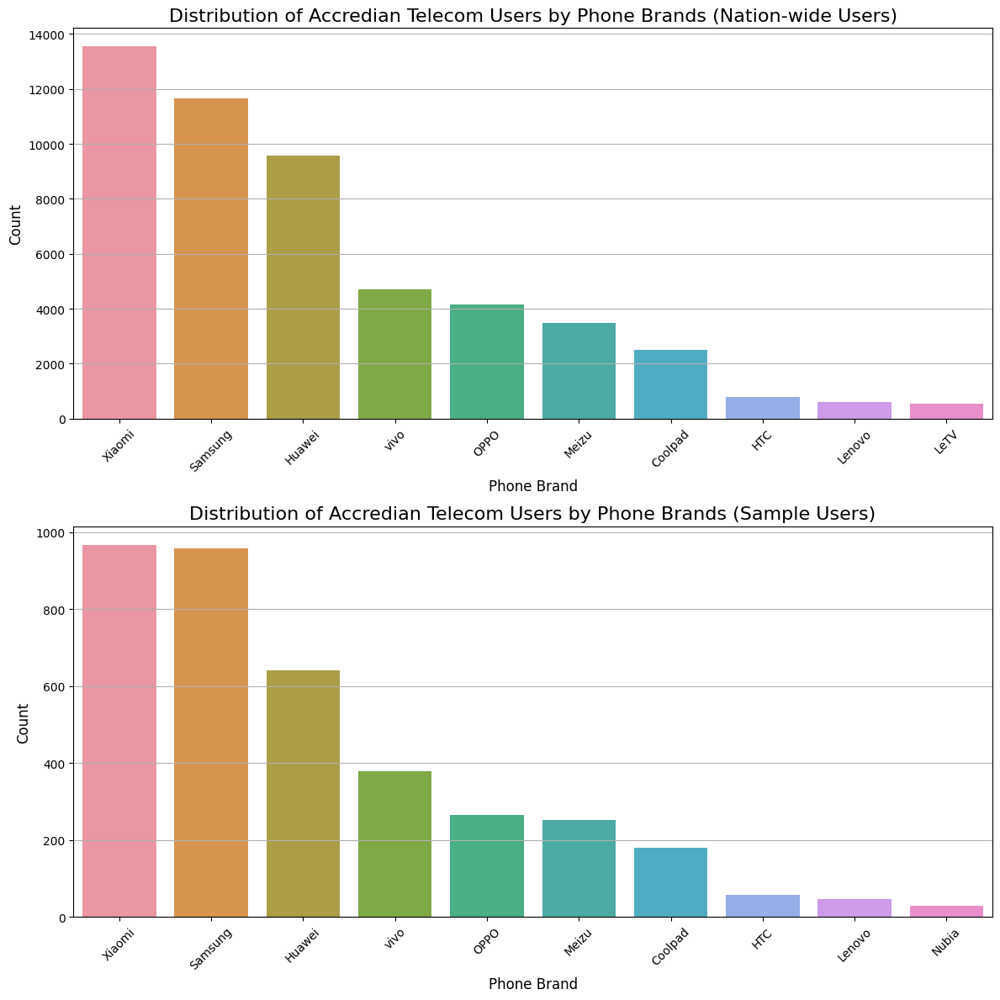

In [49]:
# Count the number of users for each phone brand in df_population
brand_counts_population = df_population['phone_brand'].value_counts().head(10)

# Count the number of users for each phone brand in df_sample
brand_counts_sample = df_sample['phone_brand'].value_counts().head(10)

# Set the color palette
sns.set_palette("viridis")

# Create a canvas with two subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12))

# Plot for df_population (Nation-wide users)
ax1 = axes[0]
sns.barplot(x=brand_counts_population.index, y=brand_counts_population.values, ax=ax1)
ax1.set_title('Distribution of Accredian Telecom Users by Phone Brands (Nation-wide Users)', fontsize=16)
ax1.set_xlabel('Phone Brand', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='x', labelrotation=45)
ax1.grid(axis='y')

# Plot for df_sample (Sample users)
ax2 = axes[1]
sns.barplot(x=brand_counts_sample.index, y=brand_counts_sample.values, ax=ax2)
ax2.set_title('Distribution of Accredian Telecom Users by Phone Brands (Sample Users)', fontsize=16)
ax2.set_xlabel('Phone Brand', fontsize=12)
ax2.set_ylabel('Count', fontsize=12)
ax2.tick_params(axis='x', labelrotation=45)
ax2.grid(axis='y')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

In [50]:
# Print the observations for df_population (Nation-wide users)
print("Observations - Nation-wide Users:")
for brand, count in brand_counts_population.items():
    print(f"- Phone Brand {brand}: {count} users")

# Print the observations for df_sample (Sample users)
print("Observations - Sample Users:")
for brand, count in brand_counts_sample.items():
    print(f"- Phone Brand {brand}: {count} users")

Observations - Nation-wide Users:
- Phone Brand Xiaomi: 13541 users
- Phone Brand Samsung: 11657 users
- Phone Brand Huawei: 9584 users
- Phone Brand vivo: 4713 users
- Phone Brand OPPO: 4159 users
- Phone Brand Meizu: 3495 users
- Phone Brand Coolpad: 2492 users
- Phone Brand HTC: 786 users
- Phone Brand Lenovo: 591 users
- Phone Brand LeTV: 550 users
Observations - Sample Users:
- Phone Brand Xiaomi: 967 users
- Phone Brand Samsung: 959 users
- Phone Brand Huawei: 641 users
- Phone Brand vivo: 378 users
- Phone Brand OPPO: 266 users
- Phone Brand Meizu: 251 users
- Phone Brand Coolpad: 179 users
- Phone Brand HTC: 57 users
- Phone Brand Lenovo: 47 users
- Phone Brand Nubia: 30 users


<a name = Section52></a>
### **5.2 Distribution of Phone Brands by Age Segment, State, and Gender**

In [51]:
# Create a map centered on the average latitude and longitude of the sample users
center_latitude = df_sample['latitude'].mean()
center_longitude = df_sample['longitude'].mean()
map_demographics = folium.Map(location=[center_latitude, center_longitude], zoom_start=6)

# Create marker clusters for each phone brand
phone_brands = df_sample['phone_brand'].unique()
for phone_brand in phone_brands:
    brand_data = df_sample[df_sample['phone_brand'] == phone_brand]
    marker_cluster = MarkerCluster(name=phone_brand + " Users")
    for index, row in brand_data.iterrows():
        tooltip = f"City: {row['city']}"
        popup = f"Phone Brand: {row['phone_brand']}<br>Device Model: {row['device_model']}<br>Age Segment: {row['group']}<br>Gender: {row['gender']}"
        gender_color = 'blue' if row['gender'] == 'M' else 'pink'
        marker = folium.Marker(location=[row['latitude'], row['longitude']], popup=popup, tooltip=tooltip, icon=folium.Icon(color=gender_color))
        marker.add_to(marker_cluster)
    marker_cluster.add_to(map_demographics)

# Add layer control to toggle marker clusters
folium.LayerControl().add_to(map_demographics)

# Display the map
map_demographics

<a name = Section53></a>
### **5.3 Distribution of Gender by State, Age Segment, and Phone Brand**

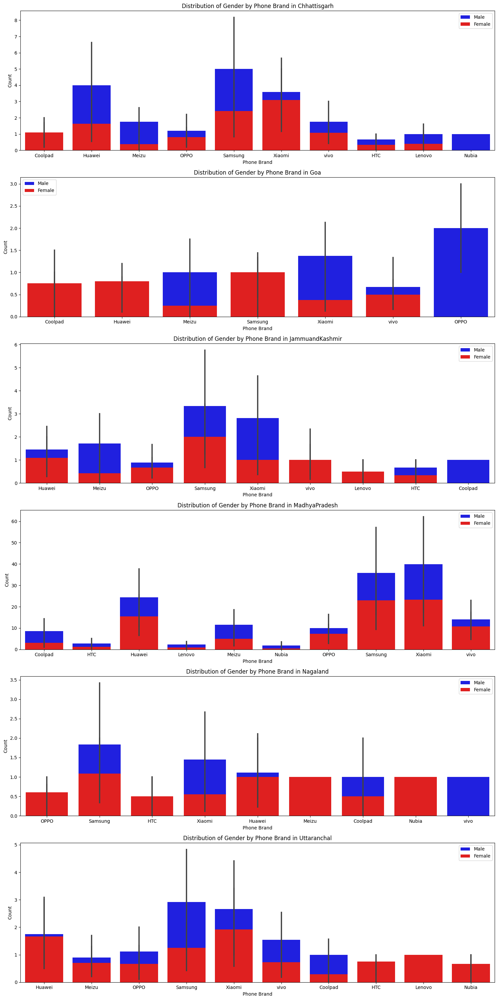

In [52]:
# Create a pivot table with counts of gender by state, age segment, and phone brand
gender_counts = df_sample.pivot_table(index=['state', 'group', 'phone_brand'], columns='gender', aggfunc='size', fill_value=0)

# Reset the index to make the pivot table columns accessible
gender_counts = gender_counts.reset_index()

# Get the top 10 phone brands based on user count
top_10_brands = gender_counts.groupby('phone_brand').sum().sort_values(by='M', ascending=False).head(10).index

# Filter the gender_counts DataFrame to include only the top 10 brands
gender_counts = gender_counts[gender_counts['phone_brand'].isin(top_10_brands)]

# Get the unique states
states = gender_counts['state'].unique()

# Define the number of rows and columns for the grid of subplots
num_rows = len(states)
num_cols = 1

# Set the size of each subplot
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

# Iterate over each state and create a subplot for each
for i, state in enumerate(states):
    state_gender_counts = gender_counts[gender_counts['state'] == state]
    
    # Create a bar plot for the current state
    ax = axs[i]
    sns.barplot(x='phone_brand', y='M', data=state_gender_counts, ax=ax, color='blue', label='Male')
    sns.barplot(x='phone_brand', y='F', data=state_gender_counts, ax=ax, color='red', label='Female')
    ax.set_xlabel('Phone Brand')
    ax.set_ylabel('Count')
    ax.set_title(f'Distribution of Gender by Phone Brand in {state}')
    ax.legend()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

<a name = Section54></a>
### **5.4 Distribution of Age Segments by State, Gender, and Phone Brand**

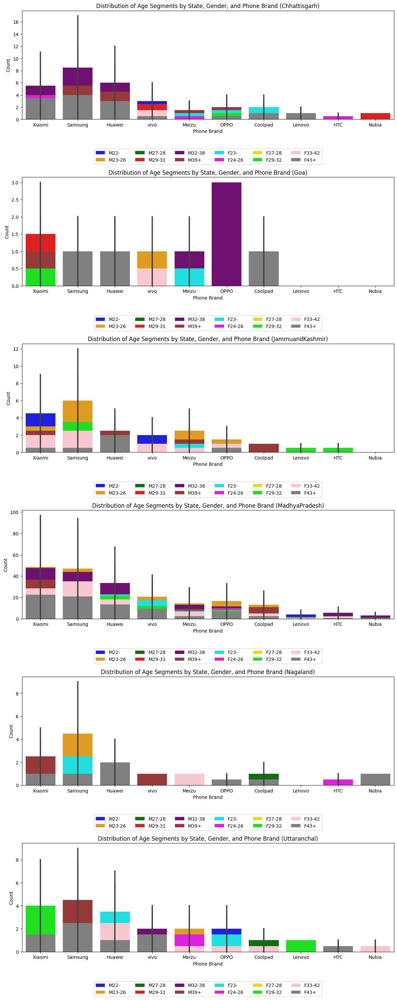

In [53]:
# Create a pivot table with counts of age segments by state, gender, and phone brand
age_segment_counts = df_sample.pivot_table(index=['state', 'gender', 'phone_brand'], columns='group', aggfunc='size', fill_value=0)

# Reset the index to make the pivot table columns accessible
age_segment_counts = age_segment_counts.reset_index()

# Get the top 10 phone brands based on user count
top_10_brands = age_segment_counts.groupby('phone_brand').sum().sort_values(by='M22-', ascending=False).head(10).index

# Filter the age_segment_counts DataFrame to include only the top 10 brands
age_segment_counts = age_segment_counts[age_segment_counts['phone_brand'].isin(top_10_brands)]

# Get the unique states
states = age_segment_counts['state'].unique()

# Define the number of rows and columns for the grid of subplots
num_rows = len(states)
num_cols = 1

# Set the size of each subplot
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 5*num_rows))

# Iterate over each state and create a subplot for each
for i, state in enumerate(states):
    # Filter the age_segment_counts DataFrame for the current state
    state_age_segment_counts = age_segment_counts[age_segment_counts['state'] == state]

    # Create a bar plot for the current state
    ax = axs[i]
    
    # Filter the top 10 brands for the current state
    state_top_10_brands = state_age_segment_counts[state_age_segment_counts['phone_brand'].isin(top_10_brands)]

    sns.barplot(x='phone_brand', y='M22-', data=state_top_10_brands, ax=ax, color='blue', label='M22-', order=top_10_brands)
    sns.barplot(x='phone_brand', y='M23-26', data=state_top_10_brands, ax=ax, color='orange', label='M23-26', order=top_10_brands)
    sns.barplot(x='phone_brand', y='M27-28', data=state_top_10_brands, ax=ax, color='green', label='M27-28', order=top_10_brands)
    sns.barplot(x='phone_brand', y='M29-31', data=state_top_10_brands, ax=ax, color='red', label='M29-31', order=top_10_brands)
    sns.barplot(x='phone_brand', y='M32-38', data=state_top_10_brands, ax=ax, color='purple', label='M32-38', order=top_10_brands)
    sns.barplot(x='phone_brand', y='M39+', data=state_top_10_brands, ax=ax, color='brown', label='M39+', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F23-', data=state_top_10_brands, ax=ax, color='cyan', label='F23-', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F24-26', data=state_top_10_brands, ax=ax, color='magenta', label='F24-26', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F27-28', data=state_top_10_brands, ax=ax, color='yellow', label='F27-28', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F29-32', data=state_top_10_brands, ax=ax, color='lime', label='F29-32', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F33-42', data=state_top_10_brands, ax=ax, color='pink', label='F33-42', order=top_10_brands)
    sns.barplot(x='phone_brand', y='F43+', data=state_top_10_brands, ax=ax, color='gray', label='F43+', order=top_10_brands)
    
    ax.set_xlabel('Phone Brand')
    ax.set_ylabel('Count')
    ax.set_title(f'Distribution of Age Segments by State, Gender, and Phone Brand ({state})')
    
    # Move the legend below the plot
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=6)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

---
<a name = Section6></a>
# **6. User Activity Analysis**
---

<a name = Section61></a>
### **6.1 Hourly Distribution of Phone Calls**

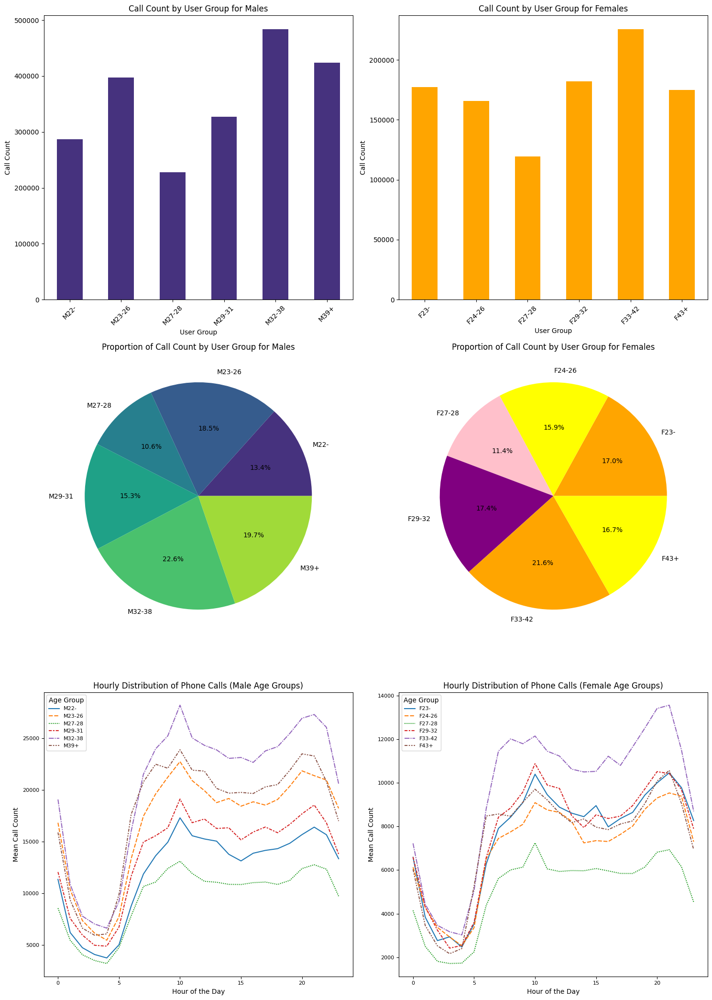

In [54]:
# Filter data for male and female users
male_df = df_population[df_population['gender'].str[0] == 'M']
female_df = df_population[df_population['gender'].str[0] == 'F']

# Set the figure size
plt.figure(figsize=(15, 21))

# Plot 1: Call Count by User Group for Males (Bar Chart)
plt.subplot(3, 2, 1)
male_group_event_count = male_df.groupby('group')['call_count'].sum()
male_group_event_count.plot(kind='bar')
plt.title('Call Count by User Group for Males')
plt.xlabel('User Group')
plt.ylabel('Call Count')
plt.xticks(rotation=45)

# Plot 2: Call Count by User Group for Females (Bar Chart)
plt.subplot(3, 2, 2)
female_group_event_count = female_df.groupby('group')['call_count'].sum()
female_group_event_count.plot(kind='bar', color='orange')
plt.title('Call Count by User Group for Females')
plt.xlabel('User Group')
plt.ylabel('Call Count')
plt.xticks(rotation=45)

# Plot 3: Proportion of Call Count by User Group for Males (Pie Chart)
plt.subplot(3, 2, 3)
male_group_event_count.plot(kind='pie', autopct='%1.1f%%')
plt.title('Proportion of Call Count by User Group for Males')
plt.ylabel('')

# Plot 4: Proportion of Call Count by User Group for Females (Pie Chart)
plt.subplot(3, 2, 4)
female_group_event_count.plot(kind='pie', autopct='%1.1f%%', colors=['orange', 'yellow', 'pink', 'purple'])
plt.title('Proportion of Call Count by User Group for Females')
plt.ylabel('')

# Plot 5: Hourly Distribution of Phone Calls for Male Age Groups
plt.subplot(3, 2, 5)
male_data = df_events_data[df_events_data['group'].str.startswith('M')]
mean_phone_call_count_male = male_data.groupby(['group', 'hour_of_day'])['event_id'].count().reset_index()
mean_phone_call_count_male = mean_phone_call_count_male.pivot(index='hour_of_day', columns='group', values='event_id')
sns.lineplot(data=mean_phone_call_count_male, palette='tab10')
plt.title('Hourly Distribution of Phone Calls (Male Age Groups)', fontsize=12)
plt.xlabel('Hour of the Day', fontsize=10)
plt.ylabel('Mean Call Count', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.legend(title='Age Group', fontsize=8)

# Plot 6: Hourly Distribution of Phone Calls for Female Age Groups
plt.subplot(3, 2, 6)
female_data = df_events_data[df_events_data['group'].str.startswith('F')]
mean_phone_call_count_female = female_data.groupby(['group', 'hour_of_day'])['event_id'].count().reset_index()
mean_phone_call_count_female = mean_phone_call_count_female.pivot(index='hour_of_day', columns='group', values='event_id')
sns.lineplot(data=mean_phone_call_count_female, palette='tab10')
plt.title('Hourly Distribution of Phone Calls (Female Age Groups)', fontsize=12)
plt.xlabel('Hour of the Day', fontsize=10)
plt.ylabel('Mean Call Count', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.legend(title='Age Group', fontsize=8)

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()

---
<a name = Section7></a>
# **7. Summary of Findings**
---

### Demographic Analysis

The distribution of AT users by gender shows a slightly higher representation of males compared to females. In the population dataset, there are 35,146 males and 19,402 females. In the sample dataset, there are 2,493 males and 1,485 females.

In [62]:
print(f"In the population dataset, there are {male_count_all} males and {female_count_all} females.")
print(f"In the sample dataset, there are {male_count_sample} males and {female_count_sample} females.")

In the population dataset, there are 35146 males and 19402 females.
In the sample dataset, there are 2493 males and 1485 females.


The age segments of AT users are well-distributed, with significant user representation across different age groups. Among male users, the highest user count is in the age segment M32-38, while among female users, the highest user count is in the age segment F33-42.

In [63]:
print("Male Users across the nation:")
for age_segment, count in male_age_counts.items():
    print(f"- {age_segment}: {count} users")

print("Female Users across the nation:")
for age_segment, count in female_age_counts.items():
    print(f"- {age_segment}: {count} users")
    
print("Male Users across M.P, Chhattisgarh, Uttaranchal, J&K, Goa & Nagaland:")
for age_segment, count in male_age_counts.items():
    print(f"- {age_segment}: {count} users")

print("Female Users across M.P, Chhattisgarh, Uttaranchal, J&K, Goa & Nagaland:")
for age_segment, count in female_age_counts.items():
    print(f"- {age_segment}: {count} users")

Male Users across the nation:
- M22-: 5285 users
- M23-26: 6947 users
- M27-28: 3996 users
- M29-31: 5379 users
- M32-38: 7083 users
- M39+: 6456 users
Female Users across the nation:
- F23-: 3606 users
- F24-26: 3009 users
- F27-28: 2233 users
- F29-32: 3410 users
- F33-42: 4050 users
- F43+: 3094 users
Male Users across M.P, Chhattisgarh, Uttaranchal, J&K, Goa & Nagaland:
- M22-: 5285 users
- M23-26: 6947 users
- M27-28: 3996 users
- M29-31: 5379 users
- M32-38: 7083 users
- M39+: 6456 users
Female Users across M.P, Chhattisgarh, Uttaranchal, J&K, Goa & Nagaland:
- F23-: 3606 users
- F24-26: 3009 users
- F27-28: 2233 users
- F29-32: 3410 users
- F33-42: 4050 users
- F43+: 3094 users


2. Geographical Analysis:

- The user base across M.P, Chhattisgarh, Uttaranchal, J&K, Goa & Nagaland represents a significant portion of the dataset, allowing for a detailed analysis of their demographics, phone brand preferences, and user activity patterns.

In [64]:
for state in states:
    state_data = df_sample[df_sample['state'] == state]
    count = len(state_data)
    print(f"- {state}, Users: {count}")

- Chhattisgarh, Users: 350
- Goa, Users: 68
- JammuandKashmir, Users: 200
- MadhyaPradesh, Users: 3038
- Nagaland, Users: 90
- Uttaranchal, Users: 232


3. Phone Brand Analysis:

- The analysis of phone brands by age segment, state, and gender provides insights into the preferences of different demographic groups. The top phone brands favored by AT users across the nation are Xiaomi, Samsung, and Huawei. In the sample dataset, the top phone brands are Xiaomi, Samsung, and Huawei as well, indicating consistency in brand preference. However, there may be variations in brand popularity within specific states and age segments.

4. User Activity Analysis:

- The hourly distribution of phone calls among AT users in the selected states highlights the patterns and trends of call activity throughout the day. The analysis reveals peak usage periods and helps optimize resource allocation and service delivery during high-demand hours.

---

Based on these findings, the following observations can be made:

- Males comprise a larger portion of the user base compared to females, with a slight variation between the population and sample datasets.
- The age segments M32-38 for males and F33-42 for females have the highest user counts, indicating a significant user presence in these age groups.
- The selected states of Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu and Kashmir, Goa, and Nagaland represent key regions for Accredian Telecom, with a considerable number of users in each state.
- Xiaomi, Samsung, and Huawei are the top phone brands preferred by AT users nationwide, with consistent brand popularity observed in the sample dataset as well.
- The hourly distribution of phone calls helps identify peak usage periods, which can inform resource allocation and service optimization.

---
<a name = Section8></a>
# **8. Actionable Insights and Recommendations**
---

### 8.1 Enhancing Personalization and Targeted Marketing

Accredian Telecom can leverage the demographic analysis to tailor marketing campaigns and promotions to specific gender and age segments. The analysis reveals that males comprise a larger portion of the user base compared to females, with 35,146 males in the population dataset and 2,493 males in the sample dataset. By understanding these demographics, Accredian Telecom can design targeted advertisements that resonate with each group's preferences and interests. For example, marketing campaigns aimed at male users can focus on technology features and gaming capabilities, while campaigns for female users can highlight camera capabilities and lifestyle features.

Additionally, the geographical analysis highlights key regions with a high concentration of Accredian Telecom users, including Madhya Pradesh, Chhattisgarh, Uttaranchal, Jammu and Kashmir, Goa, and Nagaland. By identifying these regions, Accredian Telecom can implement local advertising efforts to maximize brand exposure and engagement. This localized approach can include collaborating with local influencers or sponsoring events in these areas to increase brand awareness and connect with the target audience.

Furthermore, the phone brand analysis reveals that Xiaomi, Samsung, and Huawei are the top phone brands preferred by AT users nationwide. Accredian Telecom can capitalize on these findings by developing partnerships or exclusive offers with these popular phone brands. Collaborating with these brands can enhance customer acquisition and retention, as well as provide access to new features and technologies that align with user preferences.

Accredian Telecom can utilize the demographic analysis to tailor marketing campaigns and promotions to specific gender and age segments. By understanding the distribution of AT users by gender and age segments, Accredian Telecom can design targeted advertisements that resonate with each group's preferences and interests.

### 8.2 Improving User Experience and Engagement

Analyzing user activity patterns is crucial for improving user experience and engagement. The hourly distribution of phone calls among AT users in the selected states reveals peak usage periods and can inform resource allocation and service optimization. By identifying these peak usage hours, Accredian Telecom can optimize service availability and customer support during those periods to ensure a seamless user experience. For example, additional customer support staff can be deployed during peak hours to reduce wait times and improve customer satisfaction.

To further enhance user engagement, Accredian Telecom can consider creating interactive features or incorporating gamification elements within their app. These features can encourage users to explore different functionalities of the app, increase their time spent on the platform, and foster a sense of enjoyment and loyalty. By making the app more interactive and engaging, Accredian Telecom can increase user retention and drive higher user satisfaction.

Additionally, exploring user behavior data can uncover valuable insights for introducing new features or services that align with user preferences and usage patterns. By analyzing user behavior, Accredian Telecom can identify areas of improvement or areas where new features can be introduced to meet evolving user needs. This data-driven approach ensures that the company continues to offer innovative and relevant services to its users.

In [65]:
user_activity['group'] = df_population['group']
user_activity.head()

,device_id,mode_day_of_week,mode_hour_of_day,mode_period_of_day,group
0,122656426897450.00,Tuesday,10,Morning,M27-28
1,236977955407185.00,Wednesday,9,Morning,M27-28
2,290955718937342.00,Monday,4,Night,M39+
3,456613706964621.00,Tuesday,5,Evening,M22-
4,776379185657270.00,Friday,15,Afternoon,M23-26


In [66]:
grouped_data = user_activity.groupby('group').agg({
    'mode_day_of_week': lambda x: x.mode()[0],
    'mode_hour_of_day': lambda x: x.mode()[0],
    'mode_period_of_day': lambda x: x.mode()[0]
})

for group, row in grouped_data.iterrows():
    print(f"{group} is generally most active on {row['mode_day_of_week']} {row['mode_period_of_day']} at {row['mode_hour_of_day']} hours.")

F23- is generally most active on Friday Morning at 10 hours.
F24-26 is generally most active on Friday Morning at 10 hours.
F27-28 is generally most active on Friday Morning at 10 hours.
F29-32 is generally most active on Friday Morning at 10 hours.
F33-42 is generally most active on Friday Morning at 10 hours.
F43+ is generally most active on Friday Morning at 9 hours.
M22- is generally most active on Friday Morning at 10 hours.
M23-26 is generally most active on Friday Morning at 10 hours.
M27-28 is generally most active on Friday Morning at 10 hours.
M29-31 is generally most active on Friday Morning at 10 hours.
M32-38 is generally most active on Friday Morning at 10 hours.
M39+ is generally most active on Friday Morning at 10 hours.


### 8.3 Exploring VPN Usage and Potential Product Recommendations

The analysis of VPN usage provides insights into user privacy concerns and preferences. Accredian Telecom can leverage this analysis to understand the importance of data security and user privacy for its user base. To address these concerns, Accredian Telecom can consider partnering with reputable VPN providers or enhancing its in-house VPN offerings. By offering secure and private connections, Accredian Telecom can provide users with peace of mind and build trust with its customer base.

Additionally, Accredian Telecom should provide clear and transparent information to users about its data handling practices. This includes detailing how user data is collected, stored, and used, as well as implementing measures to ensure data security. By being transparent about data handling practices and emphasizing its commitment to privacy and security, Accredian Telecom can build trust and loyalty among its user base.

### 8.4 Collecting Data from Watches for Health Analysis

Although not covered in the analysis conducted so far, collecting data from watches can provide valuable insights for health analysis. Watches with health monitoring capabilities can track users' physical activity, heart rate, sleep patterns, and more. By collecting and analyzing this data, Accredian Telecom can gain insights into users' health and well-being, and potentially offer personalized health recommendations or services. Incorporating health-related features into the app or partnering with health-related organizations can further enhance the user experience and position Accredian Telecom as a holistic provider of telecom and health-related services.

These actionable insights and recommendations are based on the findings from the analysis conducted in this project. By implementing these recommendations, Accredian Telecom can enhance its marketing strategies, improve user experience and engagement, address privacy concerns, and explore opportunities in the health analysis domain. This will contribute to the company's growth, user satisfaction, and competitive advantage in the telecommunications industry.

In [67]:
df_vpn_user.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
2055,1936567,NaN,2016-05-02 15:27:54,75.88,22.81,Indore,MadhyaPradesh
26367,2659282,NaN,2016-05-04 14:06:24,75.89,26.95,Jaipur,Rajasthan
42088,442198,NaN,2016-05-06 09:27:37,75.85,26.96,Jaipur,Rajasthan
43061,1903648,NaN,2016-05-02 15:41:54,75.92,22.78,Indore,MadhyaPradesh
44823,3227383,NaN,2016-05-05 08:37:09,75.99,31.56,Hoshiarpur,Punjab


---
<a name = Section9></a>
# **9. Appendix and References**
---

9.1 [**Guide to Geospatial Analysis with Folium in Python**](https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/)